In [43]:
import sys
mainpath='c:/Kitti/Dropbox/PHD/Gridshells-EQCS' #location of folders
sys.path.insert(0, mainpath+'/Tekno') #location of python files
geompath=mainpath+'/Saved particle-spring shapes/' #location of saved particle-spring shapes

In [23]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import Tekno as tk
import Types as tp
import numpy as np
import Plot as ptk
import TekGeom as tg
from scipy.interpolate import UnivariateSpline
from plotly.graph_objs import Layout, Data, Figure, Marker
from plotly.graph_objs import Scatter3d, Scatter, Histogram
from plotly import tools
from plotly.offline import iplot as iplt
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)
from scipy import optimize
import pickle
import pandas as pd
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 12
import matplotlib.patches as mpatches
import matplotlib.lines as mlines

In [47]:
import importlib #for reloading
importlib.reload(tk)
import Tekno as tk
importlib.reload(tg)
import TekGeom as tg
importlib.reload(tp)
import TekGeom as tg
importlib.reload(ptk)
import Plot as ptk

# Parameters

materially and geometrically nonlinear finite element analysis to determine the ultimate load of grid shells

grid shells with various grid patterns and pipe cross-section sizes (D, T)

to see results either load previously calculated and saved results or run analyses

In [25]:
Span=40
gN=16
D=150
t=10
LperHA=[8,5,3] #loop
nb=4
GeomType=4 #relaxed grid - from particle-spring simulation in Grasshopper
nNodes=2769
nEl=3296

# Load results

In [48]:
with pd.HDFStore(mainpath+'/Saved results/alak_g.h5') as store:
    cpd_g = store['CapacityA_g']
    fpd_g = store['CapacityFA_g']
    lpd_g = store['loadA_g']
    dpd_g = store['dispA_g']
    ldpd_g = store['lastDispA_g']
size=7
CapacityA_g=np.array(cpd_g).reshape(size,3,3)
CapacityFA_g=np.array(fpd_g).reshape(size,3,3)
loadAA_g=np.array(lpd_g).reshape(size,3,3,201)
dispA_g=np.array(dpd_g).reshape(size,3,3,201)
lastDispA_g=np.array(ldpd_g).reshape(size,3,3,2769,3)

In [49]:
size=7
GRSA_g        = np.zeros((size, 3), dtype=tp.GridShell) # grid, L/H, 
for ll in [1]: #0,1,2
    LperH=LperHA[ll]
    Height=Span/LperH
    for j in [0]:
        for k in [2,6]:
            if k==0: grid='3' #projected 1% vagy 0.1%
            elif k==1: grid='1' #? talan egy nem konvergalt alak - ivesebb mindket oldalon
            elif k==2: grid='NEW100' #100% 'uniform' = '2'
            elif k==3: grid='NEW10' #10% 'uniform'
            elif k==4: grid='NEW80' #80% 'uniform'
            elif k==5: grid='NEW50' #50% 'uniform'
            elif k==6: grid='NEW1' #1% 'uniform'
            count=0
            GRS = tp.GridShell(Span,Height,D,t,gN,nb,GeomType,shape=410, grid=grid)
            tk.CreateGeom(GRS, geompath)
            GRS.SupType = 1
            GRS.GeomNL = 1
            GRS.MatNL = 1
            GRS.LoadType = j
            GRS.Steps = 200
            GRS.MinStepSize = 0.001
            tk.BuildOpsModel(GRS)
            GRSA_g[k,ll]=GRS

# Analysis

In [9]:
size=7
GRSA_g        = np.zeros((size, 3), dtype=tp.GridShell) # grid, L/H, 
CapacityFA_g = np.zeros((size, 3, 3)) # grid, L/H, teher
CapacityA_g  = np.zeros((size, 3, 3))
loadAA_g     = np.zeros((size, 3, 3, 201))
dispA_g      = np.zeros((size, 3, 3, 201))
lastDispA_g  = np.zeros((size, 3, 3, nNodes,3))
lastforceA_g  = np.zeros((size, 3, 3, nEl,12))

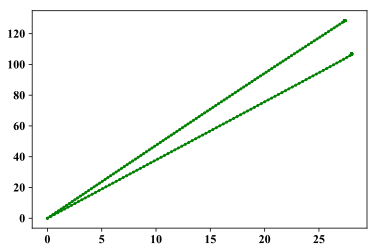

In [11]:
for ll in [1]: #0,1,2
    LperH=LperHA[ll]
    Height=Span/LperH
    for j in [0]:
        for k in [2,6]:
            if k==0: grid='3' #projected 1% vagy 0.1%
            elif k==1: grid='1' #? talan egy nem konvergalt alak - ivesebb mindket oldalon
            elif k==2: grid='NEW100' #100% 'uniform' = '2'
            elif k==3: grid='NEW10' #10% 'uniform'
            elif k==4: grid='NEW80' #80% 'uniform'
            elif k==5: grid='NEW50' #50% 'uniform'
            elif k==6: grid='NEW1' #1% 'uniform'
            count=0
            GRS = tp.GridShell(Span,Height,D,t,gN,nb,GeomType,shape=410, grid=grid)
            tk.CreateGeom(GRS,geompath)
            GRS.SupType = 1
            GRS.GeomNL = 1
            GRS.MatNL = 1
            GRS.LoadType = j
            GRS.Steps = 200
            GRS.MinStepSize = 0.001
            tk.BuildOpsModel(GRS)
            q=-35.
            for i in range(GRS.nbnBns):
                if GRS.LoadType == 0 \
                    or (GRS.GeomType==4 and GRS.LoadType == 1 and GRS.nsAll.x[GRS.nbn[i]] <= GRS.span / 2) \
                    or (GRS.GeomType==4 and GRS.LoadType == 2 and GRS.nsAll.y[GRS.nbn[i]] <= GRS.span / 2):
                        count+=1
            if j==0: area=Span**2
            else: area=Span**2/2
            Fz=q/count*area
            disp, force, ID, loadA, ok = tk.Analyze(GRS, Fz, 0, 0)
            _ = plt.plot(disp[:,ID,2],loadA, 'go-',ms=2) # dot plot
            CapacityA_g[k,ll,j]=loadA[-1]*count/area
            CapacityFA_g[k,ll,j]=loadA[-1]
            loadAA_g[k,ll,j,:]=loadA
            dispA_g[k,ll,j,:]=disp[:,ID,2]
            for ii in range(12):
                lastforceA_g[k,ll,j,:,ii]=force[-1,:,ii]
            lastDispA_g[k,ll,j,:,0]=disp[-1,:,0]
            lastDispA_g[k,ll,j,:,1]=disp[-1,:,1]
            lastDispA_g[k,ll,j,:,2]=disp[-1,:,2]
            GRSA_g[k,ll]=GRS

# Results

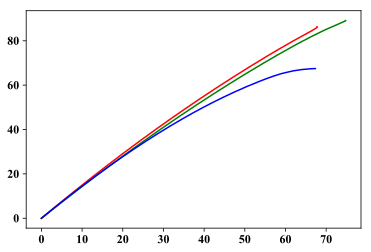

In [28]:
plt.plot(dispA_g[6,0,1],loadAA_g[6,0,1], 'r') # 1%
plt.plot(dispA_g[3,0,1],loadAA_g[3,0,1], 'g') # 10%
plt.plot(dispA_g[2,0,1],loadAA_g[2,0,1], 'b') # 100%

In [29]:
print('L/H=3')
print('1%',min(CapacityA_g[6,2,:]))
print('10%',min(CapacityA_g[3,2,:]))
print('50%',min(CapacityA_g[5,2,:]))
print('80%',min(CapacityA_g[4,2,:]))
print('100%',min(CapacityA_g[2,2,:]))
print('L/H=5')
print('1%',min(CapacityA_g[6,1,:]))
print('10%',min(CapacityA_g[3,1,:]))
print('50%',min(CapacityA_g[5,1,:]))
print('80%',min(CapacityA_g[4,1,:]))
print('100%',min(CapacityA_g[2,1,:]))
print('L/H=8')
print('1%',min(CapacityA_g[6,0,:]))
print('10%',min(CapacityA_g[3,0,:]))
print('50%',min(CapacityA_g[5,0,:]))
print('80%',min(CapacityA_g[4,0,:]))
print('100%',min(CapacityA_g[2,0,:]))

L/H=3
1% 23.2640625
10% 23.5122070312
50% 22.7640136719
80% 21.59609375
100% 18.990234375
L/H=5
1% 18.1849609375
10% 18.76328125
50% 18.333984375
80% 17.7611328125
100% 15.0793945313
L/H=8
1% 12.837890625
10% 13.1427734375
50% 12.3573242187
80% 12.5555664062
100% 9.9517578125


In [30]:
print('L/H=3')
es=min(CapacityA_g[6,2,:])
print('10% {:.0f}%'.format((min(CapacityA_g[3,2,:])-es)/es*100))
print('50% {:.0f}%'.format((min(CapacityA_g[5,2,:])-es)/es*100))
print('80% {:.0f}%'.format((min(CapacityA_g[4,2,:])-es)/es*100))
print('100% {:.0f}%'.format((min(CapacityA_g[2,2,:])-es)/es*100))
print('L/H=5')
es=min(CapacityA_g[6,1,:])
print('10% {:.0f}%'.format((min(CapacityA_g[3,1,:])-es)/es*100))
print('50% {:.0f}%'.format((min(CapacityA_g[5,1,:])-es)/es*100))
print('80% {:.0f}%'.format((min(CapacityA_g[4,1,:])-es)/es*100))
print('100% {:.0f}%'.format((min(CapacityA_g[2,1,:])-es)/es*100))
print('L/H=8')
es=min(CapacityA_g[6,0,:])
print('10% {:.0f}%'.format((min(CapacityA_g[3,0,:])-es)/es*100))
print('50% {:.0f}%'.format((min(CapacityA_g[5,0,:])-es)/es*100))
print('80% {:.0f}%'.format((min(CapacityA_g[4,0,:])-es)/es*100))
print('100% {:.0f}%'.format((min(CapacityA_g[2,0,:])-es)/es*100))

L/H=3
10% 1%
50% -2%
80% -7%
100% -18%
L/H=5
10% 3%
50% 1%
80% -2%
100% -17%
L/H=8
10% 2%
50% -4%
80% -2%
100% -22%


### Figure 3.12

In [31]:
#maximalis rudhosszak kigyujtese
GeomType=4
LavA  = np.zeros((3, 3))
MinLA = np.zeros((3, 3))
MaxLA = np.zeros((3, 3))
nbEl=824
lA=np.zeros((5,3,nbEl))
for ll in range(3): #L/H
    LperH=LperHA[ll]
    Height=Span/LperH
    alak=410
    gridA=['NEW1', 'NEW10', 'NEW100']
    for k in range(3):
        grid=gridA[k]
        filename = mainpath+'\\Saved particle-spring shapes\\{:d}x{:d}\\D{:d}{:d}\\h{:d}\\{:d}\\geometry{:s}.txt'.format(Span, Span, gN, gN, LperHA[ll], alak, grid)
        with open(filename) as f:
            content = f.readlines()
        content = [x.strip() for x in content]
        LavA[k,ll] = float(content[36])  # m
        MinLA[k,ll] = float(content[34])  # m
        MaxLA[k,ll] = float(content[35])  # m
        MaxLA[k,ll] = float(content[35])  # m
        lA[k,ll,:]= [float(i) for i in content[3].split(",")] 
print(MaxLA)

[[ 3.081664  3.481832  4.448895]
 [ 3.068029  3.451799  4.388433]
 [ 2.912579  3.103186  3.674366]]


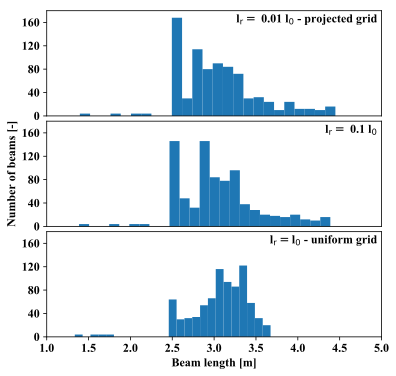

In [16]:
ll=2
nbins=25
maxy=180
fig = plt.figure(figsize=(6, 6))
gs = gridspec.GridSpec(3,1)
gs.update(wspace=0.17, hspace=0.05)
ax1 = plt.subplot(gs[0, 0]) 
plt.hist(lA[0,ll], bins=nbins)
plt.ylim(0,maxy)
plt.xlim(1,5)
plt.xticks([])
plt.yticks(np.linspace(0,160,5))
plt.text(4.95, 160, 'l$_{\\rm r}=$ 0.01 l$_{\\rm 0}$ - projected grid',horizontalalignment='right')

ax2 = plt.subplot(gs[1, 0]) 
plt.hist(lA[1,ll], bins=nbins)
plt.xlim(1,5)
plt.ylim(0,maxy)
plt.xticks([])
plt.yticks(np.linspace(0,160,5))
plt.ylabel('Number of beams [-]')
plt.text(4.95, 160, 'l$_{\\rm r}=$ 0.1 l$_{\\rm 0}$',horizontalalignment='right')

ax3 = plt.subplot(gs[2, 0]) 
plt.hist(lA[2,ll], bins=nbins)
plt.xlim(1,5)
plt.ylim(0,maxy)
plt.yticks(np.linspace(0,160,5))
plt.text(4.95, 160, 'l$_{\\rm r}=$l$_{\\rm 0}$ - uniform grid',horizontalalignment='right')

plt.xlabel('Beam length [m]')

plt.savefig('BeamLengthHist.pdf', bbox_inches='tight')

# Viewer

In [ ]:
k=2
ll=1
j=0
iplt(ptk.PlotMom(GRSA_g[k,ll],lastforceA_g[k,ll,j,:,:],2))
print(max(max(lastforceA_g[k,ll,j,:,4]),max(lastforceA_g[k,ll,j,:,10]))/1000)

In [44]:
k=6
ll=1
j=0
iplt(ptk.PlotMom(GRSA_g[k,ll],lastforceA_g[k,ll,j,:,:],2))
print(max(max(lastforceA_g[k,ll,j,:,4]),max(lastforceA_g[k,ll,j,:,10]))/1000)

14.2559011693


In [38]:
k=6 #alak
ll=1
j=0
leMax=0
ID=0
for i in range(2769):
    le=(lastDispA_g[k,ll,j,i,0]**2+lastDispA_g[k,ll,j,i,1]**2+lastDispA_g[k,ll,j,i,2]**2)
    if le>leMax:
        leMax=le
        ID=i
iplt(ptk.PlotDef(GRSA_g[k,ll], ID, lastDispA_g[k,ll,j,:,:], 50, True, False,mode=0))

In [39]:
iplt(ptk.PlotDef(GRSA_g[k,ll], ID, lastDispA_g[k,ll,j,:,:], 50, True, False,mode=0))

# Save results

In [90]:
I_df = pd.DataFrame(CapacityA_g.flatten())
J_df = pd.DataFrame(CapacityFA_g.flatten())
K_df = pd.DataFrame(loadAA_g.flatten()) 
L_df = pd.DataFrame(dispA_g.flatten())
A_df = pd.DataFrame(lastDispA_g.flatten())
with pd.HDFStore(mainpath+'/Saved results/alak_g.h5') as store:
    store['CapacityA_g']  = I_df
    store['CapacityFA_g'] = J_df
    store['loadA_g']      = K_df
    store['dispA_g']      = L_df
    store['lastDispA_g']  = A_df